###### ### The University of Melbourne, School of Computing and Information Systems
# COMP30027 Machine Learning, 2024 Semester 1

## Assignment 1: Wine quality classification with K-NN


**Student ID(s):** 1340113, 1266337
**Names:** Daksh Agrawal, Hanshi Tang

This iPython notebook is a template which you will use for your Assignment 1 submission.

Marking will be applied on the four functions that are defined in this notebook, and to your responses to the questions at the end of this notebook (Submitted in a separate PDF file).

**NOTE: YOU SHOULD ADD YOUR RESULTS, DIAGRAMS AND IMAGES FROM YOUR OBSERVATIONS IN THIS FILE TO YOUR REPORT (the PDF file).**

You may change the prototypes of these functions, and you may write other functions, according to your requirements. We would appreciate it if the required functions were prominent/easy to find.

**Adding proper comments to your code is MANDATORY. **

## 1. K-NN classifier
Reading in the Datasets for training and 

In [53]:
import pandas as pd

# Read in the Datasets
df_train = pd.read_csv("COMP30027_2024_asst1_data/winequality-train.csv")
df_test = pd.read_csv("COMP30027_2024_asst1_data/winequality-test.csv")

# Split into X (features) and Y (concept) values
trainX = df_train.drop("quality", axis=1)
trainY = df_train["quality"]
testX = df_test.drop("quality", axis=1)
testY = df_test["quality"]
testX

,fixedAcidity,volatileAcidity,citricAcid,residualSugar,chlorides,freeSulfurDioxide,totalSulfurDioxide,density,pH,sulphates,alcohol
0,8.1,0.27,0.41,1.45,0.033,11.0,63.0,0.99080,2.99,0.56,12.00
1,8.6,0.23,0.40,4.20,0.035,17.0,109.0,0.99470,3.14,0.53,9.70
2,6.6,0.16,0.40,1.50,0.044,48.0,143.0,0.99120,3.54,0.52,12.40
3,6.2,0.66,0.48,1.20,0.029,29.0,75.0,0.98920,3.33,0.39,12.80
4,7.2,0.32,0.36,2.00,0.033,37.0,114.0,0.99060,3.10,0.71,12.30
...,...,...,...,...,...,...,...,...,...,...,...
1345,6.2,0.21,0.28,5.70,0.028,45.0,121.0,0.99168,3.21,1.08,12.15
1346,6.2,0.41,0.22,1.90,0.023,5.0,56.0,0.98928,3.04,0.79,13.00
1347,6.5,0.23,0.38,1.30,0.032,29.0,112.0,0.99298,3.29,0.54,9.70
1348,6.6,0.32,0.36,8.00,0.047,57.0,168.0,0.99490,3.15,0.46,9.60


In [54]:
from math import dist

def majority_voting(x):
    """
    Simple majority voting function, returns the modal class in x,
    while accounting for tie cases, in which returns the label of x[0] (1-NN)
    :param x: List of zeroes of ones
    :return: 0 or 1: Winner of Majority Voting
    """
    freq = dict()
    for i in range(len(x)):
        freq[x[i]] = freq.get(x[i], 0) + 1
    max_freq = max(freq.values())
    best_labels = [x for x in freq if freq[x] == max_freq]
    if len(best_labels) > 1:
        return x[0]
    return best_labels[0]


def predict_KNN_basic(trainX, trainY, testX, k):
    y = []
    # Considering each test instance
    for i in range(testX.shape[0]):
        
        # Test Instance Data Row
        input_row = testX.T[i].to_numpy()
        
        #Calculate distance from all training points using math.dist
        distance = trainX.apply(lambda x: dist(x.to_numpy(), input_row), axis=1)
        trainX["distance"] = distance
        
        # Join X and y for easier sorting
        train = pd.concat([trainX, trainY], axis=1)

        # Sort all rows by distance and pick the k smallest distance rows
        nearest_neighbors = train.sort_values(by=['distance'], ascending=True)[:k]
        
        # Do a majority vote on concepts of Nearest Neighbours
        y.append(majority_voting(nearest_neighbors["quality"].to_numpy()))
        
        # Remove the temporary distance metric added earlier
        trainX.drop("distance", axis=1, inplace=True)
    return y

## 2. 1-NN classification

#### NOTE: you may develope codes or functions to help respond to the question here, but your formal answer must be submitted separately as a PDF.

In [55]:
from sklearn import metrics
import matplotlib.pyplot as plt
import seaborn as sns


def display_results(y_test, y_pred, title):
    """
    Utility function to plot the confusion matrix
    :param y_test: Actual concept values
    :param y_pred: Predicted concept values
    :return: None (Just plots the confusion matrix)
    """
    
    # Print the accuracy report, including precision, recall, F1 and
    # other values
    print(metrics.classification_report(y_test, y_pred))
    
    sns.reset_orig()  # Reset seaborn settings to get rid of the grid
    
    # Prepare and show the Confusion Matrix, using sklearn library functions
    confusion_matrix = metrics.confusion_matrix(y_test, y_pred)
    cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix=confusion_matrix, display_labels=[False, True])
    cm_display.plot()
    cm_display.ax_.set_title(title)
    plt.show()

              precision    recall  f1-score   support

           0       0.81      0.80      0.80       820
           1       0.69      0.72      0.71       530

    accuracy                           0.76      1350
   macro avg       0.75      0.76      0.75      1350
weighted avg       0.77      0.76      0.77      1350


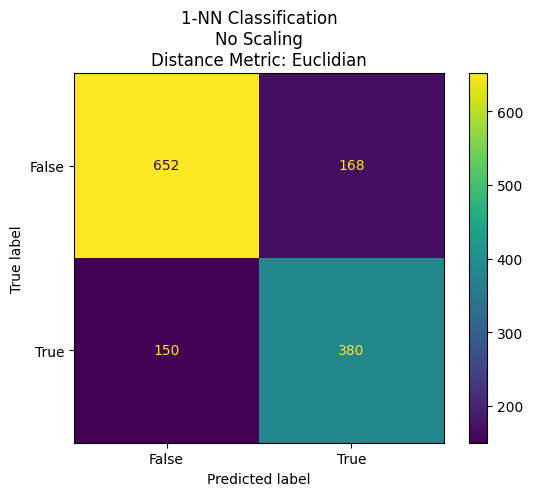

In [56]:
y_predict = predict_KNN_basic(trainX, trainY, testX, k=1)
display_results(testY, y_predict, "1-NN Classification\nNo Scaling\nDistance Metric: Euclidian")

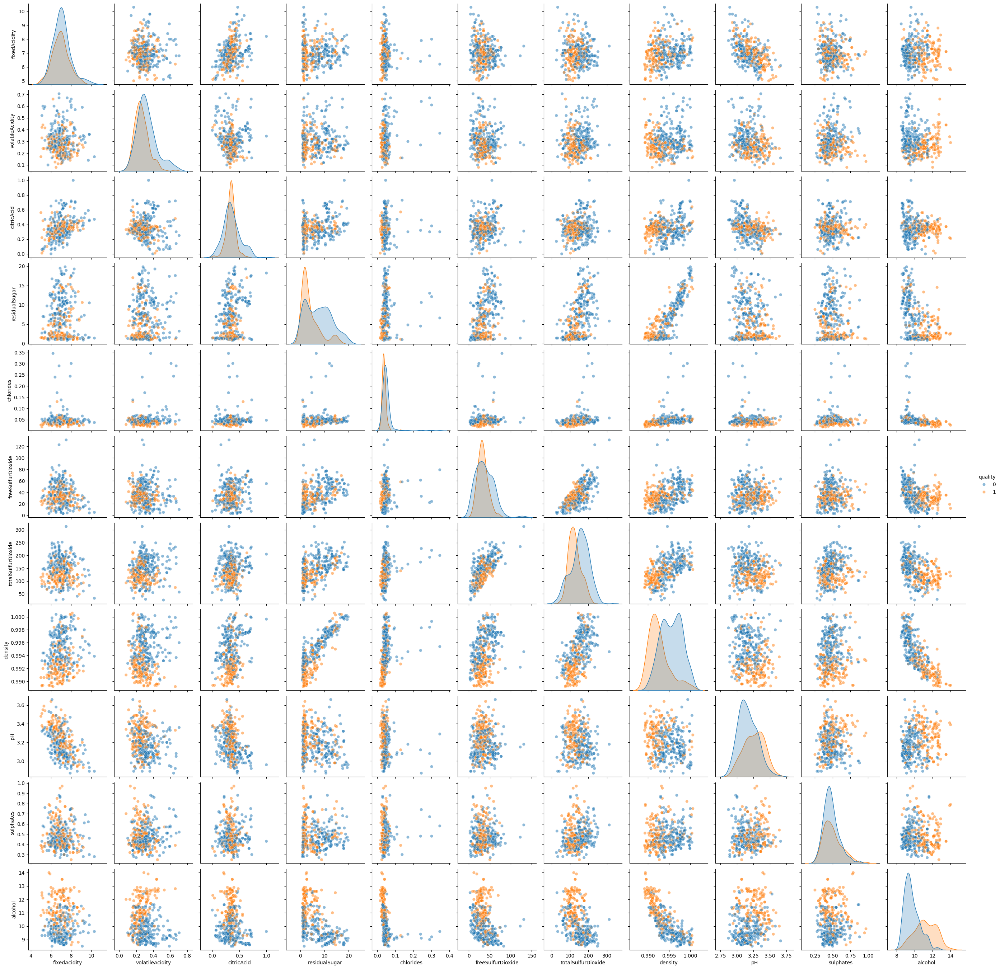

In [57]:
# Draw a pairplot grid for all possible combinations, used to eyeball potential
# correlations and distinguishing factors
import seaborn as sns

sns.pairplot(df_train.head(400), hue="quality", kind='scatter', plot_kws={'alpha': 0.5})
plt.show()

While most have mixed up distribution of both points, some pair plots strongly indicate strong distinction between different classes, specially the ones involving alcohol and density. Thus, these factors can induce significant distances for 1-NN to work well.

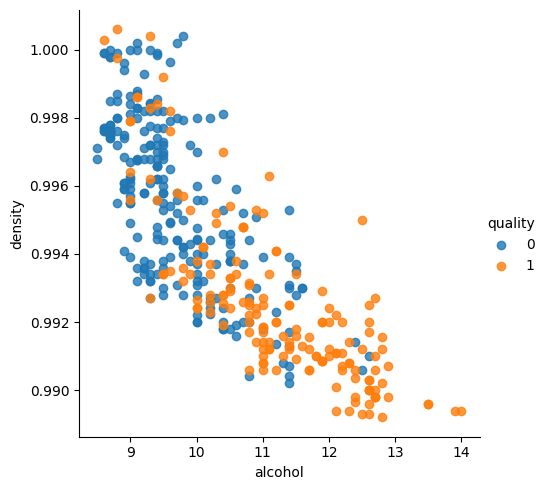

In [58]:
sns.lmplot(x='alcohol', y='density', data=df_train.head(400), hue='quality', fit_reg=False)
plt.show()

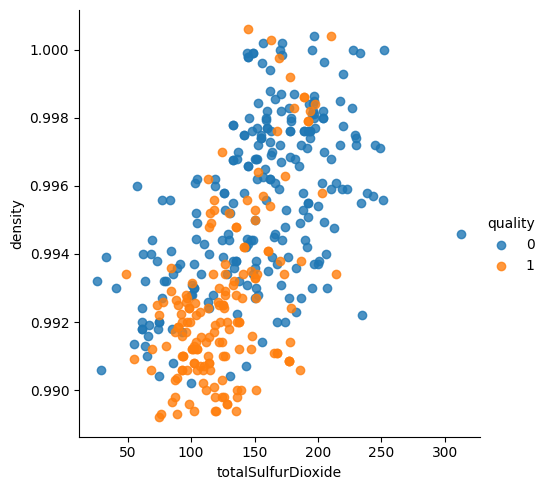

In [59]:
sns.lmplot(x='totalSulfurDioxide', y='density', data=df_train.head(400), hue='quality', fit_reg=False)
plt.show()

## 3. Normalization

#### NOTE: you may develope codes or functions to help respond to the question here, but your formal answer must be submitted separately as a PDF.

In [60]:
class MinMaxScaler:
    def __init__(self):
        self.params = dict()

    def fit(self, df: pd.DataFrame):
        # Store the min and max value of each column while fitting
        # to use for scaling later
        for col in df.columns:
            self.params[col] = [df[col].min(), df[col].max()]

    def transform(self, old_df: pd.DataFrame):
        # Transform each column using the min max scaling method, using
        # the min max values stored previously while fitting
        
        new_df = pd.DataFrame()
        for col in old_df.columns:
            new_df[col] = (old_df[col] - self.params[col][0]) / (self.params[col][1] - self.params[col][0])
        return new_df

In [61]:
scaler = MinMaxScaler()

# Fit on training data
scaler.fit(trainX)
print(scaler.params)

# Transform both training and test data
trainX_min_max_scaled = scaler.transform(trainX)
testX_min_max_scaled = scaler.transform(testX)
trainX_min_max_scaled

{'fixedAcidity': [4.2, 11.8], 'volatileAcidity': [0.08, 1.1], 'citricAcid': [0.0, 1.0], 'residualSugar': [0.6, 23.5], 'chlorides': [0.014, 0.346], 'freeSulfurDioxide': [2.0, 289.0], 'totalSulfurDioxide': [9.0, 440.0], 'density': [0.98711, 1.0024], 'pH': [2.8, 3.74], 'sulphates': [0.25, 0.99], 'alcohol': [8.0, 14.2]}


,fixedAcidity,volatileAcidity,citricAcid,residualSugar,chlorides,freeSulfurDioxide,totalSulfurDioxide,density,pH,sulphates,alcohol
0,0.486842,0.098039,0.37,0.026201,0.078313,0.048780,0.153132,0.319817,0.404255,0.513514,0.451613
1,0.539474,0.333333,0.62,0.814410,0.078313,0.135889,0.378190,0.856115,0.191489,0.567568,0.274194
2,0.315789,0.088235,0.38,0.039301,0.054217,0.090592,0.238979,0.280576,0.478723,0.405405,0.548387
3,0.263158,0.568627,0.48,0.026201,0.045181,0.094077,0.153132,0.136691,0.563830,0.189189,0.774194
4,0.302632,0.225490,0.14,0.301310,0.090361,0.111498,0.287703,0.548725,0.446809,0.337838,0.241935
...,...,...,...,...,...,...,...,...,...,...,...
1345,0.263158,0.147059,0.38,0.043668,0.090361,0.034843,0.241299,0.304120,0.531915,0.648649,0.548387
1346,0.263158,0.441176,0.02,0.013100,0.063253,0.013937,0.167053,0.342054,0.468085,0.135135,0.241935
1347,0.171053,0.235294,0.13,0.030568,0.069277,0.149826,0.341067,0.309353,0.489362,0.175676,0.435484
1348,0.302632,0.245098,0.38,0.336245,0.102410,0.229965,0.382831,0.510791,0.361702,0.337838,0.258065


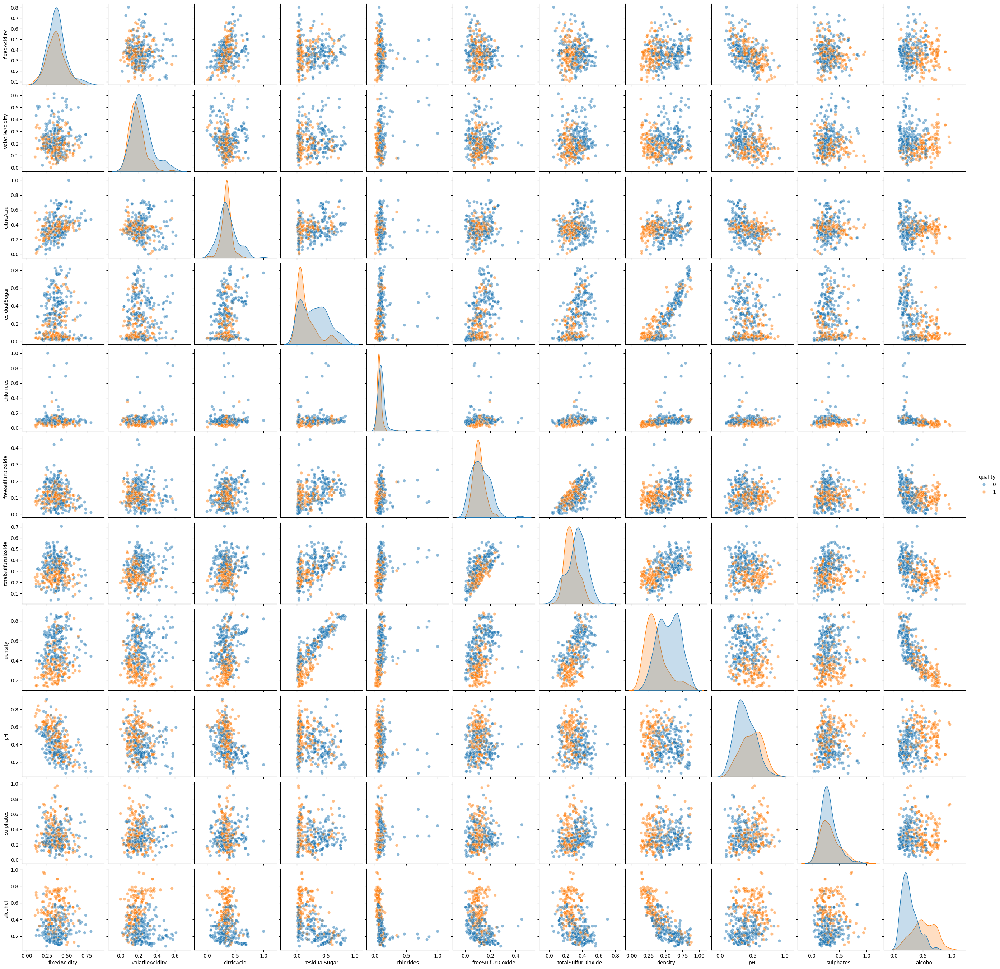

In [62]:
import seaborn as sns

sns.pairplot(pd.concat([trainX_min_max_scaled, trainY], axis=1).head(400), hue="quality", kind='scatter',
             plot_kws={'alpha': 0.5})
plt.show()

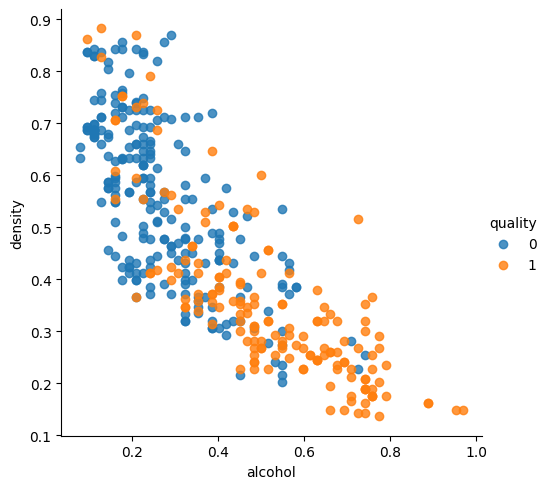

In [63]:
sns.lmplot(x='alcohol', y='density', data=pd.concat([trainX_min_max_scaled, trainY], axis=1).head(400).head(400),
           hue='quality',
           fit_reg=False)
plt.show()

We can see that while there is no difference in the distribution itself, the scale of all values is normalised, which allows K-NN to weigh all attributes equally, and not be biased by the scale of values.

              precision    recall  f1-score   support

           0       0.89      0.86      0.87       820
           1       0.79      0.84      0.81       530

    accuracy                           0.85      1350
   macro avg       0.84      0.85      0.84      1350
weighted avg       0.85      0.85      0.85      1350


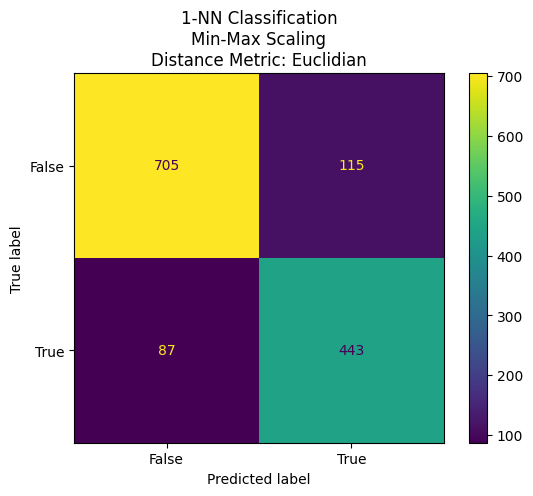

In [64]:
y_predict = predict_KNN_basic(trainX_min_max_scaled, trainY, testX_min_max_scaled, k=1)
display_results(testY, y_predict, "1-NN Classification\nMin-Max Scaling\nDistance Metric: Euclidian")

In [65]:
class StandardScaler:
    def __init__(self):
        self.params = dict()

    def fit(self, df: pd.DataFrame):
        # Store the mean and standard deviation value of each column 
        # while fitting to use for scaling later
        for col in df.columns:
            self.params[col] = [df[col].mean(), df[col].std()]

    def transform(self, old_df: pd.DataFrame):
        # Transform each column using the Standard scaling method, using
        # the mean std values stored previously while fitting
        new_df = pd.DataFrame()
        for col in old_df.columns:
            new_df[col] = (old_df[col] - self.params[col][0]) / self.params[col][1]
        return new_df

In [66]:
scaler = StandardScaler()
scaler.fit(trainX)
print(scaler.params)
trainX_standard_scaled = scaler.transform(trainX)
testX_standard_scaled = scaler.transform(testX)
trainX_standard_scaled

{'fixedAcidity': [6.878666666666668, 0.840011560512069], 'volatileAcidity': [0.29514074074074076, 0.11251183368865972], 'citricAcid': [0.3304814814814815, 0.12360470193434994], 'residualSugar': [6.37, 4.981263634668681], 'chlorides': [0.04688, 0.025662353409334066], 'freeSulfurDioxide': [34.907407407407405, 18.147936798066926], 'totalSulfurDioxide': [139.67851851851853, 44.38901984783982], 'density': [0.9941069777777778, 0.002953276612457955], 'pH': [3.1855407407407403, 0.1489597118164747], 'sulphates': [0.48830370370370374, 0.1155796154300205], 'alcohol': [10.44108888888889, 1.2915958378756716]}


,fixedAcidity,volatileAcidity,citricAcid,residualSugar,chlorides,freeSulfurDioxide,totalSulfurDioxide,density,pH,sulphates,alcohol
0,1.215856,-1.023366,0.319717,-1.037889,-0.268097,-1.041849,-1.457084,-0.713437,-0.037196,1.225963,0.277882
1,1.692040,1.109743,2.342294,2.585689,-0.268097,0.335718,0.728141,2.063140,-1.379841,1.572044,-0.573778
2,-0.331741,-1.112245,0.400620,-0.977664,-0.579838,-0.380617,-0.623544,-0.916602,0.432729,0.533799,0.742424
3,-0.807925,3.242852,1.209651,-1.037889,-0.696740,-0.325514,-1.457084,-1.661537,0.969787,-0.850528,1.826354
4,-0.450787,0.132068,-1.541054,0.226850,-0.112227,-0.050001,-0.150454,0.471687,0.231333,0.101197,-0.728625
...,...,...,...,...,...,...,...,...,...,...,...
1345,-0.807925,-0.578968,0.400620,-0.957588,-0.112227,-1.262260,-0.601016,-0.794703,0.768391,2.091167,0.742424
1346,-0.807925,2.087418,-2.511891,-1.098115,-0.462935,-1.592876,-1.321915,-0.598311,0.365597,-1.196610,-0.728625
1347,-1.641247,0.220948,-1.621957,-1.017814,-0.385000,0.556129,0.367692,-0.767614,0.499862,-0.937048,0.200458
1348,-0.450787,0.309827,0.400620,0.387452,0.043644,1.823491,0.773198,0.275295,-0.305725,0.101197,-0.651201


              precision    recall  f1-score   support

           0       0.91      0.86      0.89       820
           1       0.81      0.87      0.84       530

    accuracy                           0.87      1350
   macro avg       0.86      0.87      0.86      1350
weighted avg       0.87      0.87      0.87      1350


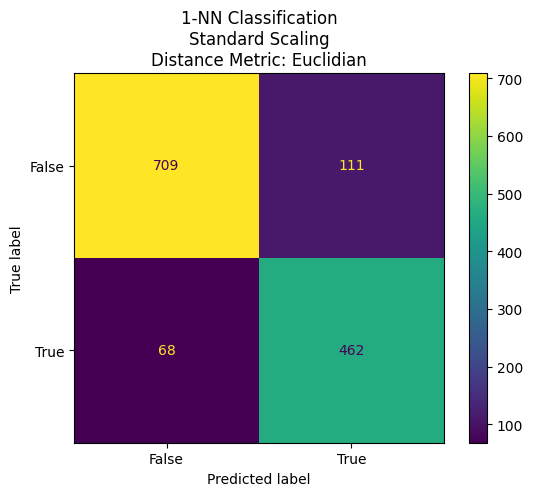

In [67]:
y_predict_standard_scaler = predict_KNN_basic(trainX_standard_scaled, trainY, testX_standard_scaled, k=1)
display_results(testY, y_predict_standard_scaler, "1-NN Classification\nStandard Scaling\nDistance Metric: Euclidian")

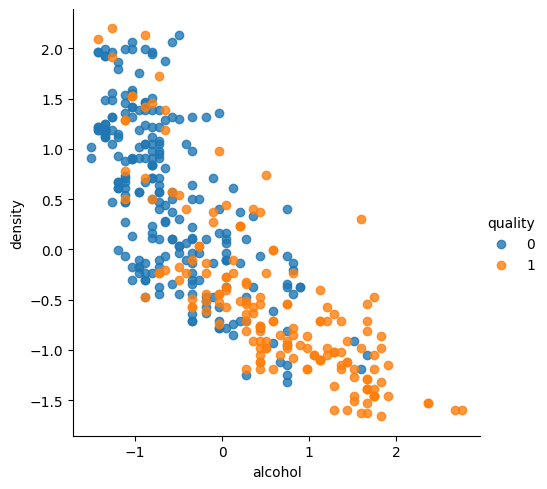

In [68]:
sns.lmplot(x='alcohol', y='density', data=pd.concat([trainX_standard_scaled, trainY], axis=1).head(400), hue='quality',
           fit_reg=False)
plt.show()

Again, same argument as before.

## 4. Model extensions

#### NOTE: you may develope codes or functions to help respond to the question here, but your formal answer must be submitted separately as a PDF.

### 4.1
Compare the performance of your best 1-NN model from Question 3 to a Gaussian naive Bayes model on this dataset (you may use library functions to implement the Gaussian naive Bayes model). In your write-up, state the accuracy of the naive Bayes model and identify instances where the two models disagree. Why do the two models classify these instances differently?

              precision    recall  f1-score   support

           0       0.87      0.74      0.80       820
           1       0.67      0.83      0.74       530

    accuracy                           0.77      1350
   macro avg       0.77      0.78      0.77      1350
weighted avg       0.79      0.77      0.78      1350


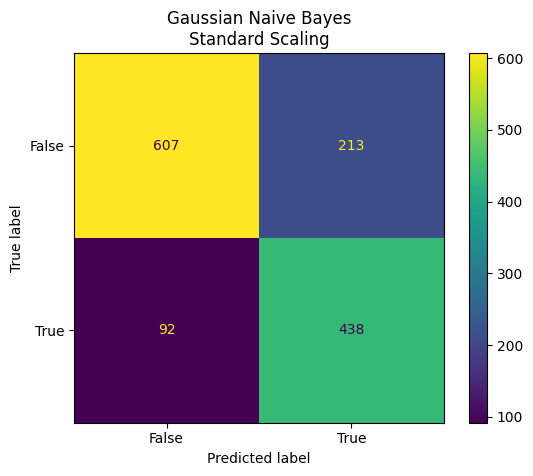

In [69]:
from sklearn.naive_bayes import GaussianNB

gnb = GaussianNB()
y_pred_gnb = gnb.fit(trainX_standard_scaled, trainY).predict(testX_standard_scaled)
display_results(testY, y_pred_gnb, "Gaussian Naive Bayes\nStandard Scaling")

Comparing the results of GNB and StandardScalar, we can see that the accuracy of GNB is 0.77, which is significantly lower than the 1-NN model. This is because GNB assumes that the features are independent, which is not the case in this dataset. This is evident from the pair plots, where we can see that some features are strongly correlated with each other, and thus, GNB fails to capture this relationship.

Correlation between totalSulfurDioxide and freeSulfurDioxide =  0.6460755738369195
Correlation between density and residualSugar =  0.8302292204222723


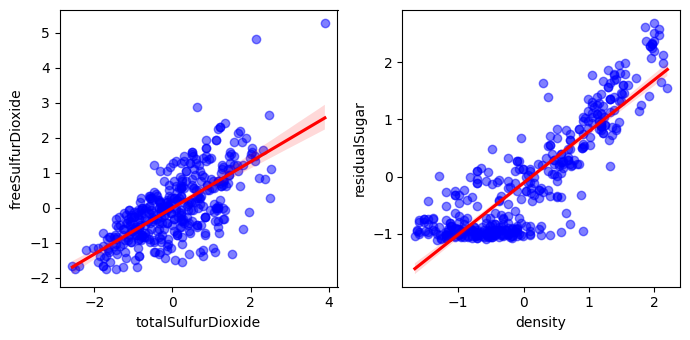

In [70]:
# Plots to visualise interdependence present
plt.rcParams["figure.figsize"] = [7.00, 3.50]
plt.rcParams["figure.autolayout"] = True

fig, ax = plt.subplots(1, 2)
sns.regplot(x='totalSulfurDioxide',
            y='freeSulfurDioxide',
            data=trainX_standard_scaled.head(400),
            ax=ax[0],
            scatter_kws={"color": "blue", "alpha": 0.5},
            line_kws={"color": "red"})
print("Correlation between totalSulfurDioxide and freeSulfurDioxide = ",
      trainX_standard_scaled['totalSulfurDioxide'].corr(trainX_standard_scaled['freeSulfurDioxide']))

sns.regplot(x='density',
            y='residualSugar',
            data=trainX_standard_scaled.head(400),
            ax=ax[1],
            scatter_kws={"color": "blue", "alpha": 0.5},
            line_kws={"color": "red"})
print("Correlation between density and residualSugar = ",
      trainX_standard_scaled['density'].corr(trainX_standard_scaled['residualSugar']))
plt.show()

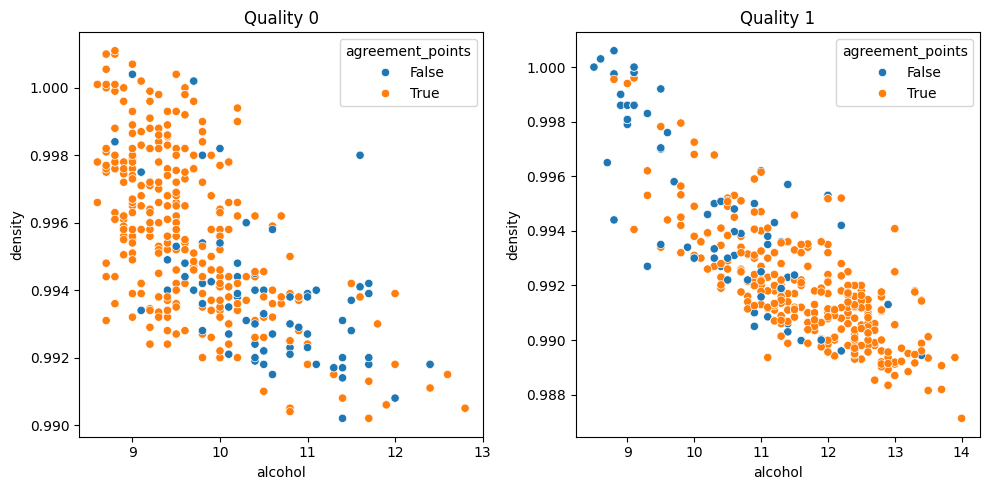

In [71]:
plt.rcParams["figure.figsize"] = [10, 5]
agreement_points = y_predict_standard_scaler == y_pred_gnb
df_disagreement_points = df_test.assign(agreement_points=agreement_points)

fig, ax = plt.subplots(1, 2)
sns.scatterplot(x="alcohol", y="density", hue="agreement_points", ax=ax[0],
                data=df_disagreement_points.loc[df_disagreement_points["quality"] == 0].head(400))
ax[0].set_title("Quality 0")
sns.scatterplot(x="alcohol", y="density", hue="agreement_points", ax=ax[1],
                data=df_disagreement_points.loc[df_disagreement_points["quality"] == 1].head(400))
ax[1].set_title("Quality 1")
plt.show()

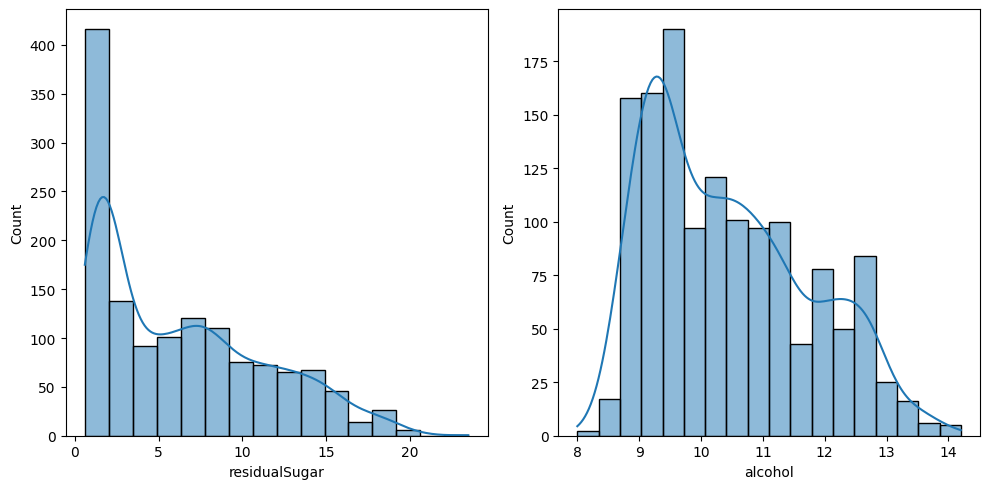

In [72]:
fig, ax = plt.subplots(1, 2)
sns.histplot(trainX["residualSugar"], kde=True, ax=ax[0])
sns.histplot(trainX["alcohol"], kde=True, ax=ax[1])
plt.show()

### 4.2
Implement two additional distance measures for your K-NN model: cosine similarity and Mahalanobis distance (you may use library functions for these distance measures). Do 1-NN classification using each of these new distance measures and the three normalization options from Question 3. Discuss how the new distance metrics compare to Euclidean distance and how each metric is affected by normalization.

In [90]:
import numpy as np
from scipy.spatial.distance import cdist


def predict_KNN_basic(trainX, trainY, testX, k, metric="euclidean"):
    y = []
    
    # Calculate the inverse of covariance matrix, used later in case of mahalanobis
    # distance
    vi = np.linalg.inv(np.cov(trainX.T))
    
    for i in range(testX.shape[0]):
        # Fetch the test row, and convert to suitable format for distance calculations
        input_row = testX.T[i].to_numpy().reshape(1, -1)
        
        # Provide additional inverse covariance matrix for mahalanobis distance calculation
        if metric == "mahalanobis":
            distance = trainX.apply(lambda x: cdist(x.to_numpy().reshape(1,-1),
                input_row, metric=metric,VI=vi), axis=1)
        else:
            distance = trainX.apply(lambda x: cdist(x.to_numpy().reshape(1, -1),input_row, metric=metric), axis=1)
        
        trainX["distance"] = distance
        
        # Join trainX and trainY for easier sorting
        train = pd.concat([trainX, trainY], axis=1)
            
        # Sort by distance and find k nearest neighbours
        nearest_neighbors = train.sort_values(by=['distance'], ascending=True)[:k]
        
        # Add the result of majority voting to result list
        y.append(majority_voting(nearest_neighbors["quality"].to_numpy()))
        
        # Remove the temporary distance column
        trainX.drop("distance", axis=1, inplace=True)
    return y

### Euclidian Distance
No Scaling

              precision    recall  f1-score   support

           0       0.81      0.80      0.80       820
           1       0.69      0.72      0.71       530

    accuracy                           0.76      1350
   macro avg       0.75      0.76      0.75      1350
weighted avg       0.77      0.76      0.77      1350


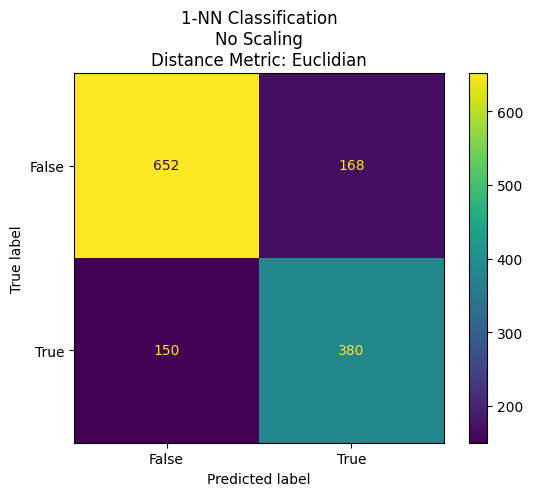

In [74]:
y_predict = predict_KNN_basic(trainX, trainY, testX, k=1)
display_results(testY, y_predict, "1-NN Classification\nNo Scaling\nDistance Metric: Euclidian")

MinMax Scaling

              precision    recall  f1-score   support

           0       0.89      0.86      0.87       820
           1       0.79      0.84      0.81       530

    accuracy                           0.85      1350
   macro avg       0.84      0.85      0.84      1350
weighted avg       0.85      0.85      0.85      1350


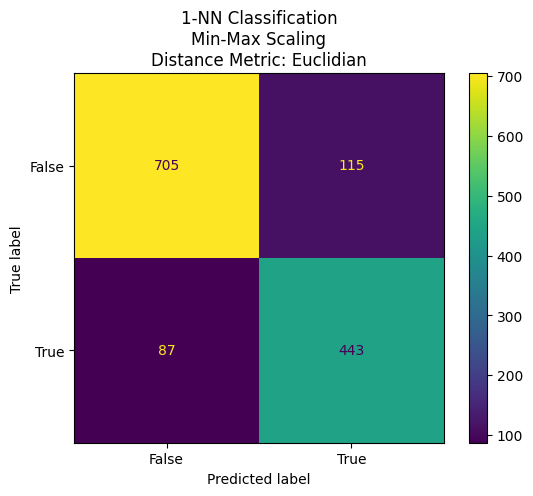

In [75]:
y_predict = predict_KNN_basic(trainX_min_max_scaled, trainY, testX_min_max_scaled, k=1)
display_results(testY, y_predict, "1-NN Classification\nMin-Max Scaling\nDistance Metric: Euclidian")

Standard Scaling

              precision    recall  f1-score   support

           0       0.91      0.86      0.89       820
           1       0.81      0.87      0.84       530

    accuracy                           0.87      1350
   macro avg       0.86      0.87      0.86      1350
weighted avg       0.87      0.87      0.87      1350


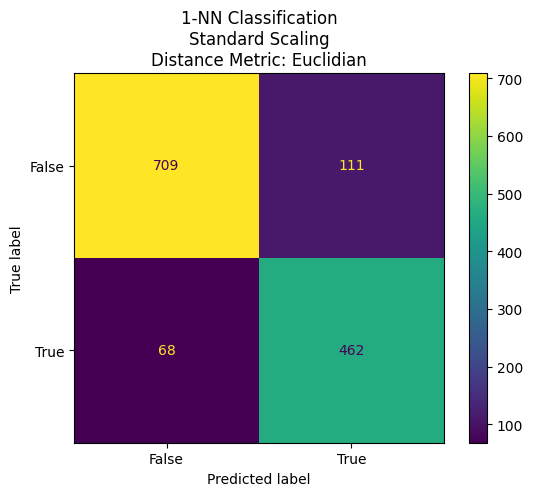

In [76]:
y_predict = predict_KNN_basic(trainX_standard_scaled, trainY, testX_standard_scaled, k=1)
display_results(testY, y_predict, "1-NN Classification\nStandard Scaling\nDistance Metric: Euclidian")

### Cosine Similarity

0       [[0.0019743820015362123]]
1        [[0.017307232401568506]]
2        [[0.008732001261447797]]
3          [[0.0199371118213173]]
4        [[0.013337762207744297]]
                  ...            
1345     [[0.008404445993578036]]
1346     [[0.008334964803931144]]
1347     [[0.017284028509541915]]
1348      [[0.03287525746758757]]
1349     [[0.016430531230954837]]
Length: 1350, dtype: object
0        [[0.003483258454739069]]
1        [[0.006637438615043623]]
2        [[0.004590238567422356]]
3         [[0.02512013175435268]]
4        [[0.005286921005006606]]
                  ...            
1345    [[0.0018081618562577617]]
1346     [[0.004054356582033014]]
1347     [[0.009536669892664884]]
1348     [[0.025038686087039297]]
1349     [[0.010070988647267742]]
Length: 1350, dtype: object
0        [[0.009867037565291614]]
1        [[0.009197534254812623]]
2       [[0.0033124637946571056]]
3        [[0.004588689126013956]]
4       [[0.0037589632485464097]]
                  ...     

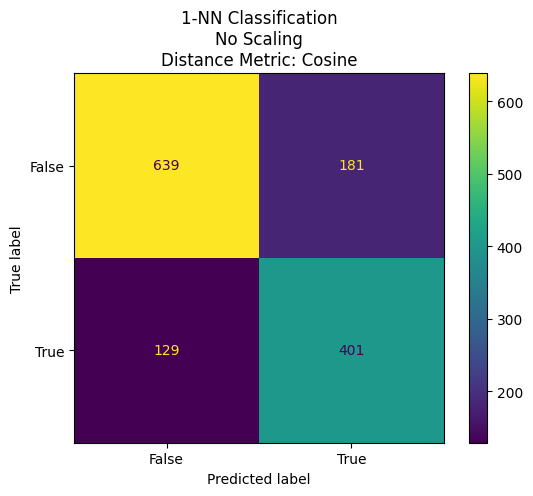

In [91]:
y_predict = predict_KNN_basic(trainX, trainY, testX, k=1, metric="cosine")
display_results(testY, y_predict, "1-NN Classification\nNo Scaling\nDistance Metric: Cosine")

              precision    recall  f1-score   support

           0       0.89      0.86      0.88       820
           1       0.79      0.84      0.82       530

    accuracy                           0.85      1350
   macro avg       0.84      0.85      0.85      1350
weighted avg       0.85      0.85      0.85      1350


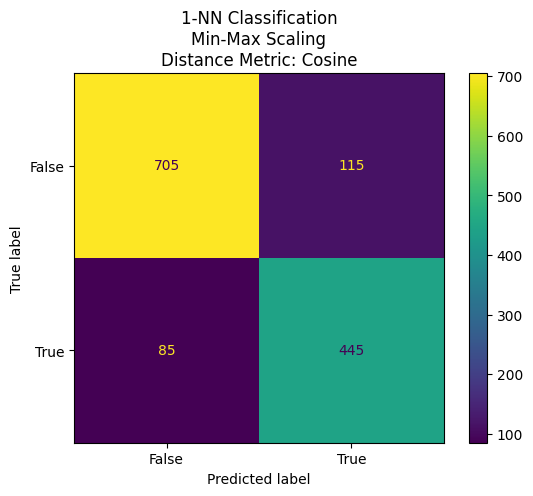

In [78]:
y_predict = predict_KNN_basic(trainX_min_max_scaled, trainY, testX_min_max_scaled, k=1, metric="cosine")
display_results(testY, y_predict, "1-NN Classification\nMin-Max Scaling\nDistance Metric: Cosine")

              precision    recall  f1-score   support

           0       0.91      0.86      0.89       820
           1       0.80      0.87      0.83       530

    accuracy                           0.86      1350
   macro avg       0.86      0.86      0.86      1350
weighted avg       0.87      0.86      0.87      1350


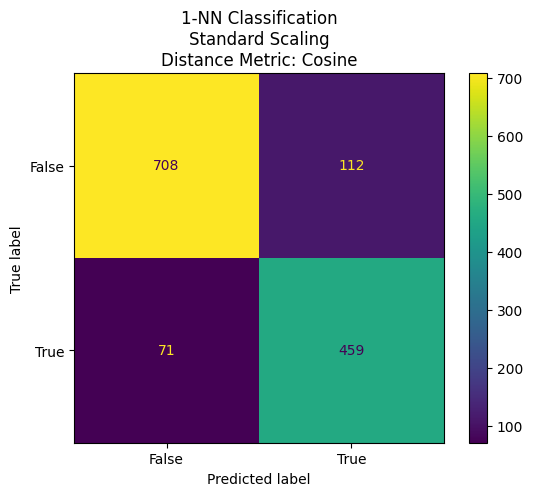

In [79]:
y_predict = predict_KNN_basic(trainX_standard_scaled, trainY, testX_standard_scaled, k=1, metric="cosine")
display_results(testY, y_predict, "1-NN Classification\nStandard Scaling\nDistance Metric: Cosine")

### Mahalanobis Distance

              precision    recall  f1-score   support

           0       0.90      0.87      0.88       820
           1       0.80      0.84      0.82       530

    accuracy                           0.86      1350
   macro avg       0.85      0.85      0.85      1350
weighted avg       0.86      0.86      0.86      1350


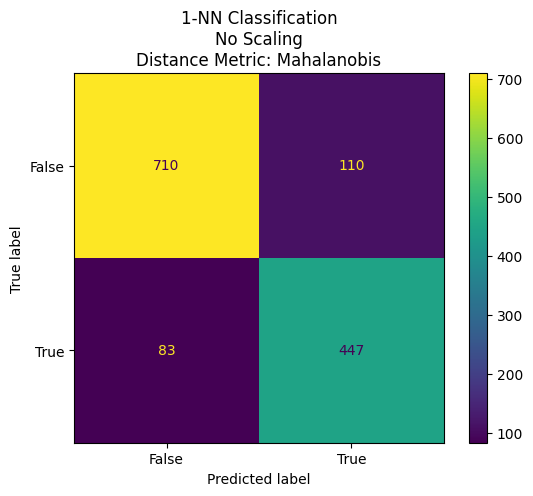

In [80]:
y_predict = predict_KNN_basic(trainX, trainY, testX, k=1, metric="mahalanobis")
display_results(testY, y_predict, "1-NN Classification\nNo Scaling\nDistance Metric: Mahalanobis")

              precision    recall  f1-score   support

           0       0.90      0.87      0.88       820
           1       0.80      0.84      0.82       530

    accuracy                           0.86      1350
   macro avg       0.85      0.85      0.85      1350
weighted avg       0.86      0.86      0.86      1350


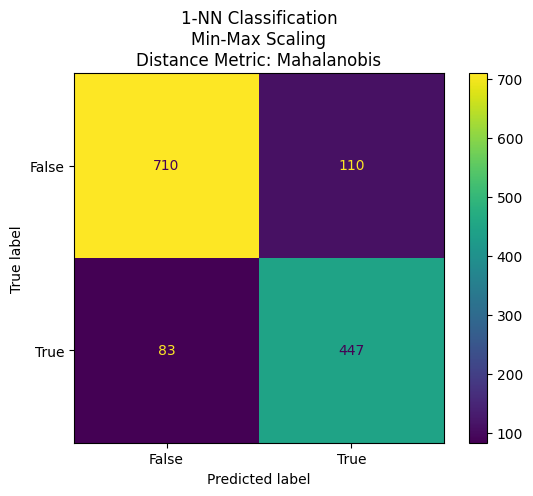

In [81]:
y_predict = predict_KNN_basic(trainX_min_max_scaled, trainY, testX_min_max_scaled, k=1, metric="mahalanobis")
display_results(testY, y_predict, "1-NN Classification\nMin-Max Scaling\nDistance Metric: Mahalanobis")

              precision    recall  f1-score   support

           0       0.90      0.87      0.88       820
           1       0.80      0.84      0.82       530

    accuracy                           0.86      1350
   macro avg       0.85      0.85      0.85      1350
weighted avg       0.86      0.86      0.86      1350


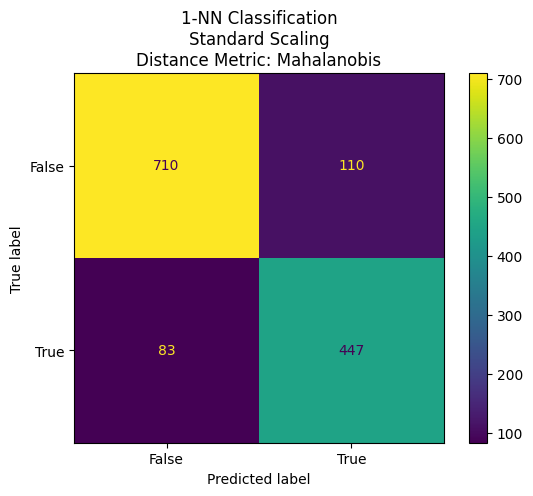

In [82]:
y_predict = predict_KNN_basic(trainX_standard_scaled, trainY, testX_standard_scaled, k=1, metric="mahalanobis")
display_results(testY, y_predict, "1-NN Classification\nStandard Scaling\nDistance Metric: Mahalanobis")

### 4.3
Implement either of the two K-NN weighting strategies discussed in lecture (inverse linear distance or inverse distance). Compare the performance of the weighted and majority vote models for a few different values of K. In your write-up, discuss how weighting strategy and the value of K affect the model's decisions.

In [83]:
import math


def weighted_voting(x, weights):
    """
    Utility function for voting, based on corresponding weights
    while accounting for tie cases
    :param x: Array of zeroes and ones
    :param weights: Weights between 0 and 1
    :return: Winning quality (0 or 1)
    """
    freq = dict()
    for i in range(len(x)):
        freq[x[i]] = freq.get(x[i], 0) + weights[i]
    max_freq = max(freq.values())
    best_labels = [x for x in freq if freq[x] == max_freq]
    if len(best_labels) > 1:
        return x[0]
    return best_labels[0]


def predict_KNN_weighted(trainX, trainY, testX, k):
    y = []
    for i in range(testX.shape[0]):
        input_row = testX.T[i]

        def dist(row):
            return math.dist(row.to_numpy(), input_row.to_numpy())

        train = pd.concat([trainX, trainY], axis=1)
        train["distance"] = trainX.apply(dist, axis=1)
        nearest_neighbors = train.sort_values(by=['distance'], ascending=True)[:k]

        nearest_neighbors["weights"] = nearest_neighbors["distance"].apply(
            lambda x: 1 / (x + 0.5))

        y.append(weighted_voting(nearest_neighbors["quality"].to_numpy(), nearest_neighbors["weights"].to_numpy()))
    return y

Weighted KNN with k=1
              precision    recall  f1-score   support

           0       0.91      0.86      0.89       820
           1       0.81      0.87      0.84       530

    accuracy                           0.87      1350
   macro avg       0.86      0.87      0.86      1350
weighted avg       0.87      0.87      0.87      1350


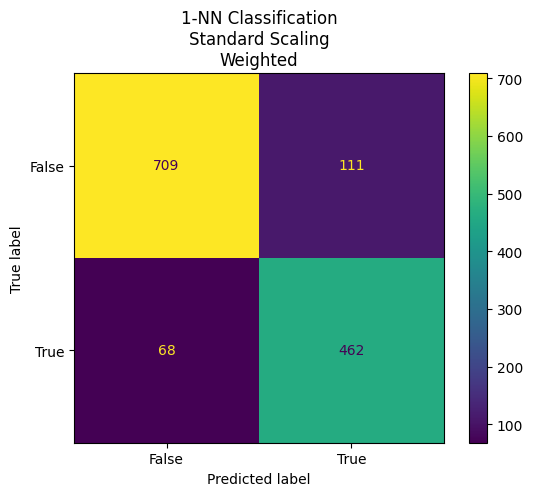

Normal KNN with k=1
              precision    recall  f1-score   support

           0       0.91      0.86      0.89       820
           1       0.81      0.87      0.84       530

    accuracy                           0.87      1350
   macro avg       0.86      0.87      0.86      1350
weighted avg       0.87      0.87      0.87      1350


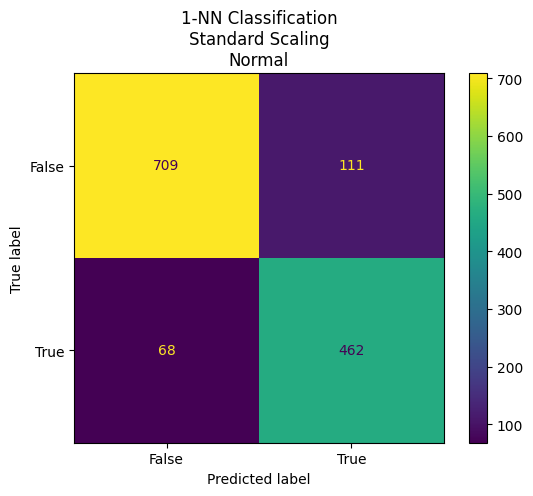

In [84]:
y_predict_weighted = predict_KNN_weighted(trainX_standard_scaled, trainY, testX_standard_scaled, 1)
y_predict_basic = predict_KNN_basic(trainX_standard_scaled, trainY, testX_standard_scaled, 1)
print("Weighted KNN with k=1")
display_results(testY, y_predict_weighted, "1-NN Classification\nStandard Scaling\nWeighted")
print("Normal KNN with k=1")
display_results(testY, y_predict_basic, "1-NN Classification\nStandard Scaling\nNormal")

Weighted KNN with k=3
              precision    recall  f1-score   support

           0       0.91      0.86      0.89       820
           1       0.80      0.87      0.84       530

    accuracy                           0.87      1350
   macro avg       0.86      0.87      0.86      1350
weighted avg       0.87      0.87      0.87      1350


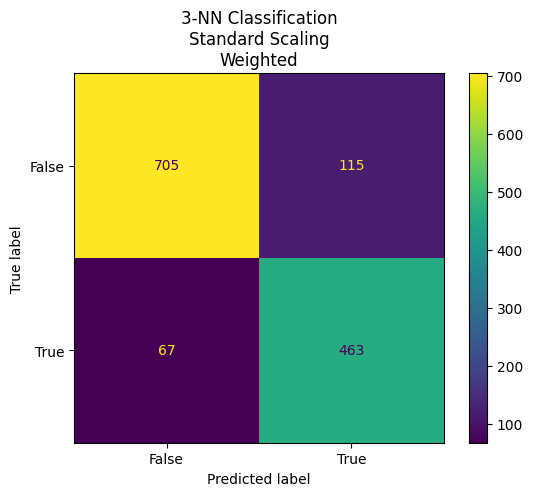

Normal KNN with k=3
              precision    recall  f1-score   support

           0       0.90      0.84      0.87       820
           1       0.78      0.85      0.81       530

    accuracy                           0.85      1350
   macro avg       0.84      0.85      0.84      1350
weighted avg       0.85      0.85      0.85      1350


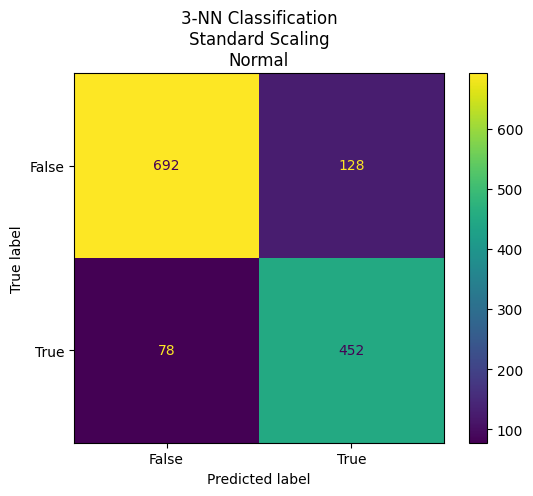

In [85]:
y_predict_weighted = predict_KNN_weighted(trainX_standard_scaled, trainY, testX_standard_scaled, 3)
y_predict_basic = predict_KNN_basic(trainX_standard_scaled, trainY, testX_standard_scaled, 3)
print("Weighted KNN with k=3")
display_results(testY, y_predict_weighted, "3-NN Classification\nStandard Scaling\nWeighted")
print("Normal KNN with k=3")
display_results(testY, y_predict_basic, "3-NN Classification\nStandard Scaling\nNormal")

Weighted KNN with k=5
              precision    recall  f1-score   support

           0       0.92      0.85      0.88       820
           1       0.79      0.88      0.83       530

    accuracy                           0.86      1350
   macro avg       0.85      0.86      0.86      1350
weighted avg       0.87      0.86      0.86      1350


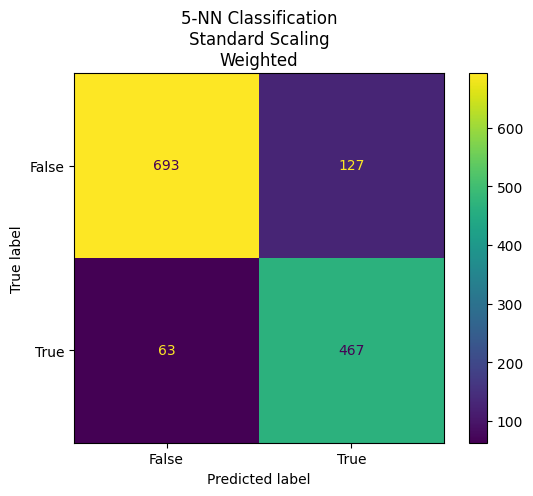

Normal KNN with k=5
              precision    recall  f1-score   support

           0       0.90      0.84      0.87       820
           1       0.77      0.86      0.82       530

    accuracy                           0.85      1350
   macro avg       0.84      0.85      0.84      1350
weighted avg       0.85      0.85      0.85      1350


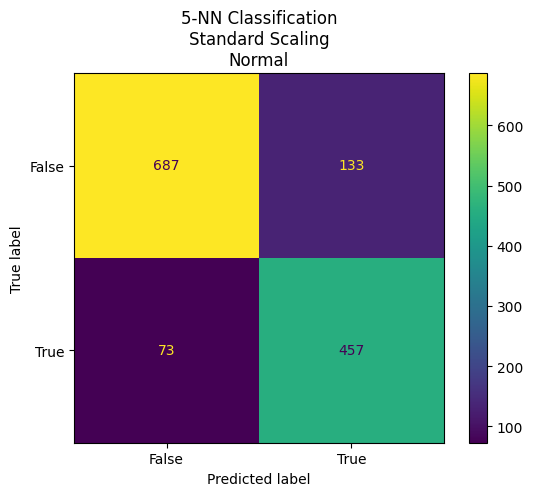

In [86]:
y_predict_weighted = predict_KNN_weighted(trainX_standard_scaled, trainY, testX_standard_scaled, 5)
y_predict_basic = predict_KNN_basic(trainX_standard_scaled, trainY, testX_standard_scaled, 5)
print("Weighted KNN with k=5")
display_results(testY, y_predict_weighted, "5-NN Classification\nStandard Scaling\nWeighted")
print("Normal KNN with k=5")
display_results(testY, y_predict_basic, "5-NN Classification\nStandard Scaling\nNormal")

### 4.4
Measure the empirical distribution of class labels in the training dataset (what percentage of the training data comes from each class). Then evaluate the distribution of labels predicted by your K-NN model for the test data, for a range of values for K. Does the class distribution of the predicted labels match the class distribution of the training data? Explain why or why not.